In [165]:
#!pip install pydoe
#!gdown --id 1O1k57hOipLRHW1icIZEFFm31dGaEFsQa -O model_utils.py
#!gdown --id 1-t4mOfZvlEVgexAe5PM7FCrfzXgWPkVz -O pwlf_mod.py

In [304]:
import model_utils as mu
mu.DEATH_RATE = 1.25
mu.ICU_RATE = 3.75
mu.HOSPITAL_RATE = 7.5
mu.SYMPTOM_RATE = 12.5
mu.INCUBATE_TIME = 4
mu.INFECT_2_HOSPITAL_TIME = 11
mu.HOSPITAL_2_ICU_TIME = 4
mu.ICU_2_DEATH_TIME = 4
mu.ICU_2_RECOVER_TIME = 7
mu.NOT_ICU_DISCHARGE_TIME = 3
mu.REPORT_RATE = 0.8
#mu.SHEET_URL = "https://docs.google.com/spreadsheets/d/1IaEttnFXBT8s0x33vBKQSrZbcf1-0T5nV2agTjhYz8Q/edit#gid=1785887522"
mu.SHEET_URL = "time_series_covid19_symptomatic_VN.csv"
#mu.SHEET_URL = "https://docs.google.com/spreadsheets/d/1430UkgyMosWnU3rMWxPvxhfUR5YNuuLV2SkRA5fn9fs/edit#gid=875032422"
#mu.SHEET_URL = "https://docs.google.com/spreadsheets/d/1XG5xqZS8O7o1XKbSxyOpiYLRnGSh8roJgfhdOmaIkso/edit#gid=1965411707"

In [305]:
import pandas as pd
import numpy as np
import pwlf_mod as pwlf
import datetime as dt
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings("ignore")

In [306]:
#Use plotly
import plotly.offline as py_offline
import cufflinks as cf
cf.go_offline()
py_offline.__PLOTLY_OFFLINE_INITIALIZED = True

In [307]:
# Add for Google Colab
#import plotly
#plotly.io.renderers.default = 'colab'

In [308]:
import imp; imp.reload(mu)

<module 'model_utils' from '/home/quoc/github/Covid19_VN/model_utils.py'>

In [309]:
def get_data_vn(data_file = mu.SHEET_URL):
    data_file_new = data_file.replace('/edit#gid=', '/export?format=csv&gid=')
    #print(url_1)
    data = pd.read_csv(data_file_new, sep=',').set_index('date')
    data.index = pd.to_datetime(data.index)
    return data.sort_index()
def get_data_vn_by_province(province='TPHCM', district='All', data_file = mu.SHEET_URL):
    vn_data = get_data_vn(data_file=data_file)
    if district == 'All':
        local_data = vn_data.query('tinh_thanh == "{}"'.format(province)).iloc[:,:].sort_index().sum(level='date')
    else:
        local_data = vn_data.query('tinh_thanh == "{}" and quan_huyen == "{}"'.format(province, district))\
                         .iloc[:,:].sort_index().sum(level='date')
    idx = pd.date_range(min(local_data.index), max(local_data.index))
    local_data = local_data.reindex(idx, fill_value=0)
    return local_data

In [310]:
def get_avg_data(data, smoothing_days=7, col_suffix='_avg'):
    idx = pd.date_range(min(data.index)+dt.timedelta(-smoothing_days), max(data.index))
    data_avg = data.reindex(idx, fill_value=0).rolling(smoothing_days, min_periods=1).mean()
    data_avg.columns = data_avg.columns + col_suffix
    return data_avg[min(data.index):max(data.index)]

In [311]:
def get_transformed_data(data, smoothing_days=7):
    # Turn 0 to nan to avoid log of 0
    data_avg = get_avg_data(data, smoothing_days=smoothing_days)
    data_avg[data_avg<= 0.01] = np.nan
    return np.log(data_avg)

In [312]:
def predict(data, forecast_horizon=30, policy_effective_dates=[], smoothing_days=7,  effective_rate=0.8):
    '''Since this is highly contagious disease. Daily new death, which is a proxy for daily new infected cases
    is model as d(t)=a*d(t-1) or equivalent to d(t) = b*a^(t). After a log transform, it becomes linear.
    log(d(t))=logb+t*loga, so we can use linear regression to provide forecast (use robust linear regressor to avoid
    data anomaly in death reporting)
    There are two separate linear curves, one before the lockdown is effective(21 days after lockdown) and one after
    For using this prediction to infer back the other metrics (infected cases, hospital, ICU, etc..) only the before
    curve is used and valid. If we assume there is no new infection after lock down (perfect lockdown), the after
    curve only depends on the distribution of time to death since ICU.
    WARNING: if lockdown_date is not provided, we will default to no lockdown to raise awareness of worst case
    if no action. If you have info on lockdown date please use it to make sure the model provide accurate result'''
    #for policy_effective_date in policy_effective_dates:
    #    data = data.loc[
    #        (data.index > policy_effective_date + dt.timedelta(smoothing_days)) |
    #        (data.index <= policy_effective_date)]

    data.dropna(inplace=True)
    data_start_date = min(data.index)
    data_end_date = max(data.index)
    forecast_end_date = data_end_date + dt.timedelta(forecast_horizon)
    forecast_date_index = pd.date_range(start=data_start_date, end=forecast_end_date)

    data_start_date_idx = 0
    data_end_date_idx = (data_end_date - data_start_date).days
    forecast_end_date_idx = data_end_date_idx + forecast_horizon
    forecast_time_idx = (forecast_date_index - data_start_date).days.values
    data_time_idx = (data.index - data_start_date).days.values
    policy_effective_dates_idx = (policy_effective_dates - data_start_date).days.values
    data['time_idx'] = data_time_idx
    #import pdb; pdb.set_trace()
    data = data.replace([np.inf, -np.inf], np.nan).dropna()
    break_points = np.array([data_start_date_idx, ] +
                            policy_effective_dates_idx[(~np.isnan(policy_effective_dates_idx))&
                                                       (policy_effective_dates_idx < forecast_end_date_idx)].tolist() +
                            [forecast_end_date_idx, ])
    regr_pw = pwlf.PiecewiseLinFit(x=data.time_idx.values, y=data.iloc[:,0])
    regr_pw.fit_with_breaks(break_points)
    model_beta = regr_pw.beta
    log_predicted_var = smoothing_days * regr_pw.prediction_variance(forecast_time_idx)

    # Use default slope when data is not enough to fit last line, less than 4 data point, with contain_rate=1 mean slope
    # is the same as previous slope (same policy) and 0 mean (relax 100%) slope will be same as before lockdown

    #if ((data_end_date_idx-break_points[-2]) < 4) | (model_beta[-1] > max(0.3, abs(model_beta[1]))):
    if ((data_end_date_idx-break_points[-2]) < 4) | (model_beta[-1] > max(1, abs(model_beta[1]))):
        if model_beta[-2] < 0:
            model_beta[-1] = model_beta[-2]*effective_rate
        else:
            model_beta[-1] = (-model_beta[-2])*(1+effective_rate)
        print("Use default last slope due to not enough data")
        #import pdb; pdb.set_trace()
        variance = log_predicted_var[sum(forecast_time_idx <= break_points[-2])]
        log_predicted_var_oos = variance * (forecast_time_idx[forecast_time_idx > break_points[-2]] -
                                                       break_points[-2])
        log_predicted_var = np.concatenate(
                (log_predicted_var[:sum(forecast_time_idx <= break_points[-2])],
                 log_predicted_var_oos))

    log_predicted_values = regr_pw.predict(forecast_time_idx, beta=model_beta, breaks=break_points)

    log_predicted_lower_bound_values = log_predicted_values - 1.96 * np.sqrt(log_predicted_var)
    log_predicted_upper_bound_values = log_predicted_values + 1.96 * np.sqrt(log_predicted_var)

    log_predicted = pd.DataFrame(log_predicted_values, index=forecast_date_index)
    log_predicted_lower_bound = pd.DataFrame(log_predicted_lower_bound_values, index=forecast_date_index)
    log_predicted_upper_bound = pd.DataFrame(log_predicted_upper_bound_values, index=forecast_date_index)
    log_predicted.columns = ['predicted']
    log_predicted_lower_bound.columns = ['lower_bound']
    log_predicted_upper_bound.columns = ['upper_bound']
    return pd.concat([log_predicted, log_predicted_lower_bound, log_predicted_upper_bound], axis=1, sort=True), regr_pw.beta


In [313]:
def get_infected_cases_from_symptom_cases(symptom_cases, col_suffix='_infected'):
    '''This number only is close to number of confirmed case in country very early in the disease and 
    can still do contact tracing or very wide testing, eg. South Korea, Germany, Vietnam'''
    delay_time = mu.INFECT_2_HOSPITAL_TIME - mu.INCUBATE_TIME
    infected_cases = (100/mu.SYMPTOM_RATE/mu.REPORT_RATE)*symptom_cases.tshift(-delay_time)
    infected_cases.columns = infected_cases.columns + col_suffix
    return infected_cases


In [314]:
def get_new_hospitalized_cases_from__infected_cases(infected_cases, col_suffix='_new_hospitalized'):
    '''In country with severe lack of testing, this is close to number of confirmed case, eg. Italy, Iran'''
    delay_time = mu.INFECT_2_HOSPITAL_TIME
    hospitalized_cases = (mu.HOSPITAL_RATE/100)*infected_cases.tshift(delay_time)
    hospitalized_cases.rename(columns=lambda x: x.replace('_infected', col_suffix), inplace=True)
    return hospitalized_cases


In [315]:
def get_new_ICU_cases_from__infected_cases(infected_cases, col_suffix='_new_ICU'):
    '''In country with severe lack of healthcare facility (#ICU) this is very close to death cases'''
    delay_time = mu.INFECT_2_HOSPITAL_TIME + mu.HOSPITAL_2_ICU_TIME
    ICU_cases = (mu.ICU_RATE/100)*infected_cases.tshift(delay_time)
    ICU_cases.rename(columns=lambda x: x.replace('_infected', col_suffix), inplace=True)
    return ICU_cases

In [316]:
def get_death_cases_from__infected_cases(infected_cases, col_suffix='_death'):
    '''In country with severe lack of healthcare facility (#ICU) this is very close to death cases'''
    delay_time = mu.INFECT_2_HOSPITAL_TIME + mu.HOSPITAL_2_ICU_TIME + mu.ICU_2_DEATH_TIME
    death_cases = (mu.DEATH_RATE/100)*infected_cases.tshift(delay_time)
    death_cases.rename(columns=lambda x: x.replace('_infected', col_suffix), inplace=True)
    return death_cases

In [317]:
def get_metrics_VN(province='TPHCM', district='All', data_file=mu.SHEET_URL, data = None,
                   forecast_horizon=30, policy_change_dates=[], effective_rate=0.8,
                   test_rate=0.2, back_test=False, last_data_date=dt.date.today()):
    if data is None:
        data = get_data_vn_by_province(province=province, district=district, data_file=data_file)[['f0', 'f0_community']]
    data_avg = get_avg_data(data)
    data_orig = pd.concat([data, data_avg], axis=1, sort=True)
    data_start = min(data.index.date)
    if back_test:
        data = data[data.index.date <= last_data_date]
    log_data = get_transformed_data(data)#.iloc[4:]
    policy_effective_dates = pd.to_datetime(policy_change_dates) + dt.timedelta(
            mu.INFECT_2_HOSPITAL_TIME)
    predicted_log_f0_community, beta = predict(log_data[['f0_community_avg']], 
                                               policy_effective_dates=policy_effective_dates, 
                                               effective_rate=effective_rate,
                                               forecast_horizon=forecast_horizon)
    log_f0 = pd.concat([predicted_log_f0_community, log_data], axis=1, sort=True)
    log_f0_ve = log_f0.rename(columns={'f0_community_avg': 'Log(F0 tầm soát có triệu chứng)', 'predicted': 'Dự báo Log(F0 tầm soát có triệu chứng)',
                          'lower_bound': 'Cận dưới Log(F0 tầm soát có triệu chứng)', 'upper_bound': 'Cận trên Log(F0 tầm soát có triệu chứng)', 'f0_avg':'Log(F0)'})\
        .drop(columns=['ICU_current_avg'], errors='ignore')
    symptom_cases = np.exp(predicted_log_f0_community)
    infected_cases = get_infected_cases_from_symptom_cases(symptom_cases)
    new_hospitalized_cases = get_new_hospitalized_cases_from__infected_cases(infected_cases)
    new_ICU_cases = get_new_ICU_cases_from__infected_cases(infected_cases)
    death_cases = get_death_cases_from__infected_cases(infected_cases)
    f0 = pd.concat([data_orig,
                    symptom_cases,
                    infected_cases,
                    new_hospitalized_cases,
                    new_ICU_cases,
                    death_cases
                    ], axis=1, sort=True)

    f0_ve = f0.rename(columns={'f0_community': 'F0 tầm soát có triệu chứng', 
                               'predicted': 'Dự báo F0 tầm soát có triệu chứng', 
                               'predicted_infected': 'Dự báo ca thực nhiễm',
                               'lower_bound': 'Cận dưới F0 tầm soát có triệu chứng', 
                               'upper_bound': 'Cận trên F0 tầm soát có triệu chứng', 
                               'f0':'F0', 
                               'upper_bound_infected': 'Cận trên dự báo ca thực nhiễm',  
                               'lower_bound_infected': 'Cận dưới dự báo ca thực nhiễm',
                               'f0_avg': 'Trung bình 7 ngày F0',
                               'f0_community_avg': 'Trung bình 7 ngày F0 tầm soát có triệu chứng',
                               'predicted_new_hospitalized': 'Dự báo ca nhập viện',
                               'upper_bound_new_hospitalized': 'Cận trên dự báo ca nhập viện',  
                               'lower_bound_new_hospitalized': 'Cận dưới dự báo ca nhập viện',
                               'predicted_new_ICU': 'Dự báo ca chuyển ICU',
                               'upper_bound_new_ICU': 'Cận trên dự báo ca chuyển ICU',  
                               'lower_bound_new_ICU': 'Cận dưới dự báo ca chuyển ICU',
                               'predicted_death': 'Dự báo ca tử vong',
                               'upper_bound_death': 'Cận trên dự báo ca tử vong',  
                               'lower_bound_death': 'Cận dưới dự báo ca tử vong'
                          })\
        .drop(columns=['ICU_current'], errors='ignore').fillna(value={'F0':0})
    f0_ve['F0'][f0_ve.index.date>=dt.date.today()] = np.nan 
    f0_ve['Dự báo ca thực nhiễm'][f0_ve.index.date<data_start] = np.nan
    f0_ve['Cận trên dự báo ca thực nhiễm'][f0_ve.index.date<data_start] = np.nan
    f0_ve['Cận dưới dự báo ca thực nhiễm'][f0_ve.index.date<data_start] = np.nan
    #if back_test:
    #    f0_ve['F0 tầm soát'] = data_orig['f0_community']
    #    f0_ve['7d_avg_death'] = data_orig.rolling(7, min_periods=3).mean()

    cumulative_f0_ve = f0_ve.drop(columns=['ICU', 'hospital_beds'], errors='ignore').cumsum()
 
    #cumulative_metrics['ICU'] = daily_metrics['ICU']
    #cumulative_metrics['hospital_beds'] = daily_metrics['hospital_beds']
    print('Hệ số lây nhiễm sau khi chỉ thị có hiệu lực, R0 cuối: {last}'.format(last=np.exp(sum(beta[1:]))))
    return log_f0_ve, f0_ve, cumulative_f0_ve, beta


In [318]:
get_data_vn_by_province()

,f0,f0_community
2021-04-29,1,0.0
2021-04-30,2,0.0
2021-05-01,1,0.0
2021-05-02,0,0.0
2021-05-03,0,0.0
...,...,...
2021-07-22,2264,157.0
2021-07-23,1733,279.0
2021-07-24,2845,151.0
2021-07-25,1743,302.0


In [319]:
policy_change_dates =['2021-05-31', '2021-06-20', '2021-06-30', '2021-07-09']

In [320]:
log_f0_ve, f0_ve, cumulative_f0_ve, beta = get_metrics_VN(policy_change_dates = policy_change_dates, forecast_horizon=30)#,  last_data_date=pd.to_datetime('2021-06-28'), back_test=True)

Hệ số lây nhiễm sau khi chỉ thị có hiệu lực, R0 cuối: 1.0401364554894867


In [321]:
f0_ve.iplot()

In [322]:
log_f0_ve.iplot()

In [323]:
cumulative_f0_ve.iplot()


# Kịch  bản 



In [324]:
policy_change_dates_full =  policy_change_dates + ['2021-07-15',]

In [325]:
policy_change_dates_full

['2021-05-31', '2021-06-20', '2021-06-30', '2021-07-09', '2021-07-15']

## Kịch  bản hiệu quả cao

In [326]:
log_f0_ve_kbc, f0_ve_kbc, cumulative_f0_ve_kbc, beta = get_metrics_VN(policy_change_dates = policy_change_dates_full, effective_rate=0.9,forecast_horizon=60)
##print('Hệ số lây nhiễm sau khi chỉ thị có hiệu lực, R0 cuối: {last}'.format(last=np.exp(sum(beta[1:]))))
f0_ve_kbc.iplot(title = "Biểu độ dự báo tình hình lây nhiễm - kịch bản hiệu quả cao")
log_f0_ve_kbc.iplot(title = "Biểu độ dự báo tình hình lây nhiễm theo Log scale - kịch bản hiệu quả cao")
cumulative_f0_ve_kbc.iplot(title = "Biểu độ tổng số ca - kịch bản hiệu quả cao")

Use default last slope due to not enough data
Hệ số lây nhiễm sau khi chỉ thị có hiệu lực, R0 cuối: 1.0218598867642714


## Kịch  bản hiệu quả thấp

In [327]:
log_f0_ve_kbt, f0_ve_kbt, cumulative_f0_ve_kbt, beta = get_metrics_VN(policy_change_dates = policy_change_dates_full,
                                                                     effective_rate=0.3)
#print('Hệ số lây nhiễm sau khi chỉ thị có hiệu lực, R0 cuối: {last}'.format(last=np.exp(sum(beta[1:]))))
log_f0_ve_kbt.iplot(title = "Biểu độ dự báo tình hình lây nhiễm theo Log scale kịch  bản hiệu quả thấp ")
f0_ve_kbt.iplot(title = "Biểu độ dự báo tình hình lây nhiễm  kịch  bản hiệu quả thấp ")
cumulative_f0_ve_kbt.iplot(title = "Biểu độ tổng số ca kịch  bản hiệu quả thấp ")

Use default last slope due to not enough data
Hệ số lây nhiễm sau khi chỉ thị có hiệu lực, R0 cuối: 1.0340082308520526


#Quận / Huyện nguy cơ cao 

In [328]:
qh = get_data_vn().query('date>="2021-06-30"').groupby('quan_huyen').sum().sort_values('f0_community', ascending=False)
#qh['tc_vs_f0'] = qh.f0_community/qh.f0
bang = qh.drop(columns=['cong_dong', 'nhap_canh'], errors='ignore').sort_values('f0_community', ascending=False)
bang

,f0,f0_community
quan_huyen,,
08,2170,519.0
BINH CHANH,3630,437.0
BINH TAN,4220,405.0
HOC MON,1435,328.0
THU DUC,2846,247.0
07,2969,211.0
KHÔNG RÕ,948,177.0
12,1248,160.0
NHA BE,947,148.0


In [329]:
bang.index.sort_values()

Index(['01', '03', '04', '05', '06', '07', '08', '10', '11', '12',
       'BINH CHANH', 'BINH TAN', 'BINH THANH', 'CAN GIO', 'CU CHI', 'GO VAP',
       'HOC MON', 'KHÔNG RÕ', 'NHA BE', 'PHU NHUAN', 'TAN BINH', 'TAN PHU',
       'THU DUC'],
      dtype='object', name='quan_huyen')

In [330]:
quan_huyen = bang.index.sort_values().values

In [331]:
quan_huyen[quan_huyen != 'KHÔNG RÕ']

array(['01', '03', '04', '05', '06', '07', '08', '10', '11', '12',
       'BINH CHANH', 'BINH TAN', 'BINH THANH', 'CAN GIO', 'CU CHI',
       'GO VAP', 'HOC MON', 'NHA BE', 'PHU NHUAN', 'TAN BINH', 'TAN PHU',
       'THU DUC'], dtype=object)

In [332]:
top = bang.query('f0_community>=3')
top

,f0,f0_community
quan_huyen,,
08,2170,519.0
BINH CHANH,3630,437.0
BINH TAN,4220,405.0
HOC MON,1435,328.0
THU DUC,2846,247.0
07,2969,211.0
KHÔNG RÕ,948,177.0
12,1248,160.0
NHA BE,947,148.0


In [333]:
R0_before = []
R0_after = []
F0_gap = []
F0_gap_upper = []
F0_est = []
for district in top.index.values:
  log_f0_ve_qh, f0_ve_qh, cumulative_f0_ve_qh, beta_qh = get_metrics_VN(district=district, policy_change_dates = policy_change_dates)#, last_data_date=pd.to_datetime('2021-06-25'), back_test=True)
  last_cummulative = cumulative_f0_ve_qh.loc[str(dt.date.today()+dt.timedelta(-1))]
  R0_after_qh = np.exp(sum(beta_qh[1:]))
  R0_before_qh = np.exp(beta_qh[1])
  R0_before.append(R0_before_qh)
  R0_after.append(R0_after_qh)
  F0_est.append(last_cummulative["Dự báo ca thực nhiễm"])
  F0_gap.append(last_cummulative["Dự báo ca thực nhiễm"]-last_cummulative.F0)
  F0_gap_upper.append(last_cummulative["Cận trên dự báo ca thực nhiễm"]-last_cummulative.F0)
  print('Hệ số lây nhiễm sau khi chỉ thị có hiệu lực, R0 sau: {last}'.format(last=R0_after_qh))
  print('Hệ số lây nhiễm trước khi chỉ thị có hiệu lực, R0 trước: {before}'.format(before=R0_before_qh))
  f0_ve_qh.iplot(title = "Biểu độ dự báo tình hình lây nhiễm Quận/Huyện " + district)
  log_f0_ve_qh.iplot(title = "Biểu độ dự báo tình hình lây nhiễm theo Log scale Quận/Huyện {}, R0 Trước {}, R0 sau {}".format(district, R0_before_qh,R0_after_qh))
  cumulative_f0_ve_qh.iplot(title = "Biểu độ tổng số ca Quận/Huyện "+ district)

Hệ số lây nhiễm sau khi chỉ thị có hiệu lực, R0 cuối: 1.027742369419164
Hệ số lây nhiễm sau khi chỉ thị có hiệu lực, R0 sau: 1.027742369419164
Hệ số lây nhiễm trước khi chỉ thị có hiệu lực, R0 trước: 0.890101166997225


Hệ số lây nhiễm sau khi chỉ thị có hiệu lực, R0 cuối: 1.0053275421782142
Hệ số lây nhiễm sau khi chỉ thị có hiệu lực, R0 sau: 1.0053275421782142
Hệ số lây nhiễm trước khi chỉ thị có hiệu lực, R0 trước: 0.7479167100236916


Hệ số lây nhiễm sau khi chỉ thị có hiệu lực, R0 cuối: 0.9437269226611568
Hệ số lây nhiễm sau khi chỉ thị có hiệu lực, R0 sau: 0.9437269226611568
Hệ số lây nhiễm trước khi chỉ thị có hiệu lực, R0 trước: 1.0537617068877678


Hệ số lây nhiễm sau khi chỉ thị có hiệu lực, R0 cuối: 1.1232654907741129
Hệ số lây nhiễm sau khi chỉ thị có hiệu lực, R0 sau: 1.1232654907741129
Hệ số lây nhiễm trước khi chỉ thị có hiệu lực, R0 trước: 1.0297360726632472


Hệ số lây nhiễm sau khi chỉ thị có hiệu lực, R0 cuối: 1.0400864434797972
Hệ số lây nhiễm sau khi chỉ thị có hiệu lực, R0 sau: 1.0400864434797972
Hệ số lây nhiễm trước khi chỉ thị có hiệu lực, R0 trước: 1.2278585844490206


Hệ số lây nhiễm sau khi chỉ thị có hiệu lực, R0 cuối: 1.134682603725805
Hệ số lây nhiễm sau khi chỉ thị có hiệu lực, R0 sau: 1.134682603725805
Hệ số lây nhiễm trước khi chỉ thị có hiệu lực, R0 trước: 0.8853166417029439


Hệ số lây nhiễm sau khi chỉ thị có hiệu lực, R0 cuối: 1.062116080338416
Hệ số lây nhiễm sau khi chỉ thị có hiệu lực, R0 sau: 1.062116080338416
Hệ số lây nhiễm trước khi chỉ thị có hiệu lực, R0 trước: 0.9297173399279256


Hệ số lây nhiễm sau khi chỉ thị có hiệu lực, R0 cuối: 1.035736679698192
Hệ số lây nhiễm sau khi chỉ thị có hiệu lực, R0 sau: 1.035736679698192
Hệ số lây nhiễm trước khi chỉ thị có hiệu lực, R0 trước: 1.0046421086914519


Hệ số lây nhiễm sau khi chỉ thị có hiệu lực, R0 cuối: 1.0684186477576547
Hệ số lây nhiễm sau khi chỉ thị có hiệu lực, R0 sau: 1.0684186477576547
Hệ số lây nhiễm trước khi chỉ thị có hiệu lực, R0 trước: 0.9265185970167412


Hệ số lây nhiễm sau khi chỉ thị có hiệu lực, R0 cuối: 1.0136747254102692
Hệ số lây nhiễm sau khi chỉ thị có hiệu lực, R0 sau: 1.0136747254102692
Hệ số lây nhiễm trước khi chỉ thị có hiệu lực, R0 trước: 0.827181162684965


Hệ số lây nhiễm sau khi chỉ thị có hiệu lực, R0 cuối: 1.088206084038462
Hệ số lây nhiễm sau khi chỉ thị có hiệu lực, R0 sau: 1.088206084038462
Hệ số lây nhiễm trước khi chỉ thị có hiệu lực, R0 trước: 0.8728218975897766


Hệ số lây nhiễm sau khi chỉ thị có hiệu lực, R0 cuối: 1.113379031623255
Hệ số lây nhiễm sau khi chỉ thị có hiệu lực, R0 sau: 1.113379031623255
Hệ số lây nhiễm trước khi chỉ thị có hiệu lực, R0 trước: 0.9216343485284699


Hệ số lây nhiễm sau khi chỉ thị có hiệu lực, R0 cuối: 1.1039160631725315
Hệ số lây nhiễm sau khi chỉ thị có hiệu lực, R0 sau: 1.1039160631725315
Hệ số lây nhiễm trước khi chỉ thị có hiệu lực, R0 trước: 0.8428316760614832


Hệ số lây nhiễm sau khi chỉ thị có hiệu lực, R0 cuối: 1.1229393184871723
Hệ số lây nhiễm sau khi chỉ thị có hiệu lực, R0 sau: 1.1229393184871723
Hệ số lây nhiễm trước khi chỉ thị có hiệu lực, R0 trước: 1.0567221071240072


Hệ số lây nhiễm sau khi chỉ thị có hiệu lực, R0 cuối: 1.123205805453637
Hệ số lây nhiễm sau khi chỉ thị có hiệu lực, R0 sau: 1.123205805453637
Hệ số lây nhiễm trước khi chỉ thị có hiệu lực, R0 trước: 1.022683013515336


Hệ số lây nhiễm sau khi chỉ thị có hiệu lực, R0 cuối: 1.0290021289961049
Hệ số lây nhiễm sau khi chỉ thị có hiệu lực, R0 sau: 1.0290021289961049
Hệ số lây nhiễm trước khi chỉ thị có hiệu lực, R0 trước: 0.9696556840586708


Hệ số lây nhiễm sau khi chỉ thị có hiệu lực, R0 cuối: 1.078924726252239
Hệ số lây nhiễm sau khi chỉ thị có hiệu lực, R0 sau: 1.078924726252239
Hệ số lây nhiễm trước khi chỉ thị có hiệu lực, R0 trước: 1.1700983626828576


Hệ số lây nhiễm sau khi chỉ thị có hiệu lực, R0 cuối: 1.0283745096071655
Hệ số lây nhiễm sau khi chỉ thị có hiệu lực, R0 sau: 1.0283745096071655
Hệ số lây nhiễm trước khi chỉ thị có hiệu lực, R0 trước: 0.9150513166271917


Hệ số lây nhiễm sau khi chỉ thị có hiệu lực, R0 cuối: 1.1143980679420245
Hệ số lây nhiễm sau khi chỉ thị có hiệu lực, R0 sau: 1.1143980679420245
Hệ số lây nhiễm trước khi chỉ thị có hiệu lực, R0 trước: 0.6643747939774705


Hệ số lây nhiễm sau khi chỉ thị có hiệu lực, R0 cuối: 0.9874578859510093
Hệ số lây nhiễm sau khi chỉ thị có hiệu lực, R0 sau: 0.9874578859510093
Hệ số lây nhiễm trước khi chỉ thị có hiệu lực, R0 trước: 0.867708888244468


Hệ số lây nhiễm sau khi chỉ thị có hiệu lực, R0 cuối: 1.0363841538522822
Hệ số lây nhiễm sau khi chỉ thị có hiệu lực, R0 sau: 1.0363841538522822
Hệ số lây nhiễm trước khi chỉ thị có hiệu lực, R0 trước: 0.8995079808212346


Hệ số lây nhiễm sau khi chỉ thị có hiệu lực, R0 cuối: 0.9186534261916818
Hệ số lây nhiễm sau khi chỉ thị có hiệu lực, R0 sau: 0.9186534261916818
Hệ số lây nhiễm trước khi chỉ thị có hiệu lực, R0 trước: 0.9682351242696078


Hệ số lây nhiễm sau khi chỉ thị có hiệu lực, R0 cuối: 1.0395635289003853
Hệ số lây nhiễm sau khi chỉ thị có hiệu lực, R0 sau: 1.0395635289003853
Hệ số lây nhiễm trước khi chỉ thị có hiệu lực, R0 trước: 0.8710842815617311


In [334]:
top["F0_gap"]  =  F0_gap
top["F0_gap_upper"]  =  F0_gap_upper

In [335]:
top["R0 trước  30/6"]  =  R0_before
top["R0"]  =  R0_after
top["F0_est"]  =  F0_est

In [336]:
bang.sort_values('f0_community', ascending=False)

,f0,f0_community
quan_huyen,,
08,2170,519.0
BINH CHANH,3630,437.0
BINH TAN,4220,405.0
HOC MON,1435,328.0
THU DUC,2846,247.0
07,2969,211.0
KHÔNG RÕ,948,177.0
12,1248,160.0
NHA BE,947,148.0


In [337]:
top = top.rename(columns={'f0_community':'Ca tầm soát có triệu chứng'}).sort_values('Ca tầm soát có triệu chứng', ascending=False)
top

,f0,Ca tầm soát có triệu chứng,F0_gap,F0_gap_upper,R0 trước 30/6,R0,F0_est
quan_huyen,,,,,,,
08,2170,519.0,4897.414443,30087.540265,0.890101,1.027742,7210.414443
BINH CHANH,3630,437.0,1797.374579,30450.279072,0.747917,1.005328,5642.374579
BINH TAN,4220,405.0,293.274201,8097.273813,1.053762,0.943727,4898.274201
HOC MON,1435,328.0,4280.450666,34967.640148,1.029736,1.123265,5896.450666
THU DUC,2846,247.0,444.323951,10478.752876,1.227859,1.040086,3425.323951
07,2969,211.0,1339.133988,30434.323355,0.885317,1.134683,4332.133988
KHÔNG RÕ,948,177.0,1660.477126,7089.547314,0.929717,1.062116,2653.477126
12,1248,160.0,982.559352,18636.208124,1.004642,1.035737,2359.559352
NHA BE,947,148.0,1493.620660,10464.202733,0.926519,1.068419,2460.620660


In [338]:
top.sort_values('F0_gap', ascending=False)

,f0,Ca tầm soát có triệu chứng,F0_gap,F0_gap_upper,R0 trước 30/6,R0,F0_est
quan_huyen,,,,,,,
08,2170,519.0,4897.414443,30087.540265,0.890101,1.027742,7210.414443
HOC MON,1435,328.0,4280.450666,34967.640148,1.029736,1.123265,5896.450666
BINH CHANH,3630,437.0,1797.374579,30450.279072,0.747917,1.005328,5642.374579
KHÔNG RÕ,948,177.0,1660.477126,7089.547314,0.929717,1.062116,2653.477126
NHA BE,947,148.0,1493.620660,10464.202733,0.926519,1.068419,2460.620660
07,2969,211.0,1339.133988,30434.323355,0.885317,1.134683,4332.133988
06,1293,115.0,1003.214879,7686.744537,0.921634,1.113379,2310.214879
12,1248,160.0,982.559352,18636.208124,1.004642,1.035737,2359.559352
BINH THANH,875,97.0,841.956533,50525.567412,1.056722,1.122939,1803.956533


In [339]:
top.sort_values('F0_gap_upper', ascending=False)

,f0,Ca tầm soát có triệu chứng,F0_gap,F0_gap_upper,R0 trước 30/6,R0,F0_est
quan_huyen,,,,,,,
BINH THANH,875,97.0,841.956533,50525.567412,1.056722,1.122939,1803.956533
HOC MON,1435,328.0,4280.450666,34967.640148,1.029736,1.123265,5896.450666
BINH CHANH,3630,437.0,1797.374579,30450.279072,0.747917,1.005328,5642.374579
07,2969,211.0,1339.133988,30434.323355,0.885317,1.134683,4332.133988
08,2170,519.0,4897.414443,30087.540265,0.890101,1.027742,7210.414443
12,1248,160.0,982.559352,18636.208124,1.004642,1.035737,2359.559352
PHU NHUAN,249,30.0,143.470613,17151.078247,0.899508,1.036384,419.470613
CU CHI,612,73.0,509.904518,10761.935982,1.022683,1.123206,1302.904518
THU DUC,2846,247.0,444.323951,10478.752876,1.227859,1.040086,3425.323951


In [340]:
top.sort_values('R0', ascending=False)

,f0,Ca tầm soát có triệu chứng,F0_gap,F0_gap_upper,R0 trước 30/6,R0,F0_est
quan_huyen,,,,,,,
07,2969,211.0,1339.133988,30434.323355,0.885317,1.134683,4332.133988
HOC MON,1435,328.0,4280.450666,34967.640148,1.029736,1.123265,5896.450666
CU CHI,612,73.0,509.904518,10761.935982,1.022683,1.123206,1302.904518
BINH THANH,875,97.0,841.956533,50525.567412,1.056722,1.122939,1803.956533
05,433,53.0,427.994146,3121.904014,0.664375,1.114398,921.994146
06,1293,115.0,1003.214879,7686.744537,0.921634,1.113379,2310.214879
10,1193,101.0,479.229116,5390.455805,0.842832,1.103916,1703.229116
04,1098,116.0,795.294363,8614.251597,0.872822,1.088206,1921.294363
TAN BINH,974,63.0,-50.281412,4874.590995,1.170098,1.078925,1013.718588


# Tóm tắt

Số  ca lây nhiễm được tầm soát trong cộng đồng cho thấy mức độ lây nhiễm thực sự của Covid19 ở TP

Với cùng một chính sách giãn cách xã hội, đường logarithm của số ca lây nhiễm được tầm soát trong cộng đồng là đường thẳng, ta tạm gọi là "đường lây nhiễm". 

Đường lây nhiễm này thay đổi 11 ngày sau khi một chính sách mới có hiệu lực. 11 ngày là số ngày từ lúc bắt đầu nhiễm đến lúc có triệu chứng rõ rệt phải đi khám ở bệnh viện.

Sau khi TP thực hiện chỉ thị 15+ 16 (Gò Vấp, Q12) ngày 1/6, đường lây nhiễm có thay đổi kể từ ngày 12/6 nhưng chưa đi xuống

11 ngày sau khi thực hiện chỉ thị 10 của thành phố, đường lây nhiễm này sẽ thay đổi.

Tóm tắt về đường cam và đường xanh 

# Vẽ Biểu Đồ Tối Ưu Cho Report (thay vì Tương Tác)

In [341]:
import datetime
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import pandas as pd
import seaborn as sns
import IPython
%matplotlib inline
IPython.display.set_matplotlib_formats('svg')
pd.plotting.register_matplotlib_converters()

def plotCasesLog(log_f0_ve, place=''):
    fig, ax = plt.subplots(figsize=(12, 4))
    sns.set_style("whitegrid", {'grid.linestyle': '--', 'grid.linewidth': 0.5})
    sns.set_context("notebook", rc={"lines.linewidth": 1.75})
    palette = sns.color_palette("tab10", n_colors=3)
    style_order = ['Log(F0 tầm soát có triệu chứng)', 'Dự báo Log(F0 tầm soát có triệu chứng)', 'Log(F0)']
    z_order = ['Log(F0)', 'Dự báo Log(F0 tầm soát có triệu chứng)', 'Log(F0 tầm soát có triệu chứng)']
    sns.lineplot(data=log_f0_ve[z_order], style_order=style_order,
                palette=palette, dashes=True, markers=True)
    plt.fill_between(x=log_f0_ve.index, 
                     y1=log_f0_ve['Cận dưới Log(F0 tầm soát có triệu chứng)'], 
                     y2=log_f0_ve['Cận trên Log(F0 tầm soát có triệu chứng)'],
                     alpha=0.1, color=palette[1], edgecolor='face')
    ax.set_xlim(xmin=datetime.date(2021, 6, 1), xmax=datetime.date(2021, 8, 15))
    ax.set_ylim(ymin=-2, ymax=9)
    ax.set_xlabel('Ngày (theo tuần)')
    ax.set_ylabel('Số ca (theo hàm log)')
    ax.set_title('Biểu đồ dự báo tình hình lây nhiễm ' + place, fontsize=18)
    ax.xaxis.set_major_locator(mdates.WeekdayLocator(byweekday=0, interval=1))
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%d/%m/%y'))

def plotCases(f0_ve, place=''):
    fig, (axt, ax) = plt.subplots(nrows=2, ncols=1, figsize=(12, 8), sharex=True)
    sns.set_style("whitegrid", {'grid.linestyle': '--', 'grid.linewidth': 0.5})
    sns.set_context("notebook", rc={"lines.linewidth": 1.75})
    palette = sns.color_palette("tab10", n_colors=3)

    style_order = ['F0 tầm soát có triệu chứng', 'Trung bình 7 ngày F0 tầm soát có triệu chứng', 'Dự báo F0 tầm soát có triệu chứng']
    z_order = ['F0 tầm soát có triệu chứng', 'Trung bình 7 ngày F0 tầm soát có triệu chứng', 'Dự báo F0 tầm soát có triệu chứng']
    sns.lineplot(data=f0_ve[z_order], style_order=style_order,
                palette=palette, dashes=True, markers=True, ax=axt)
    axt.fill_between(x=f0_ve.index, 
                     y1=f0_ve['Cận dưới F0 tầm soát có triệu chứng'], 
                     y2=f0_ve['Cận trên F0 tầm soát có triệu chứng'],
                     alpha=0.1, color=palette[1], edgecolor='face')
    axt.set_xlim(xmin=datetime.date(2021, 6, 1), xmax=datetime.date(2021, 8, 15))
    axt.set_ylim(ymin=0, ymax=1000)
    axt.set_xlabel('Ngày (theo tuần)')
    axt.set_ylabel('Số ca')
    axt.set_title('Biểu đồ dự báo tình hình lây nhiễm '+place, fontsize=18)
    axt.xaxis.set_major_locator(mdates.WeekdayLocator(byweekday=0, interval=1))
    axt.xaxis.set_major_formatter(mdates.DateFormatter('%d/%m/%y'))

    style_order = ['F0', 'Trung bình 7 ngày F0', 'Dự báo ca thực nhiễm']
    z_order = ['F0', 'Trung bình 7 ngày F0', 'Dự báo ca thực nhiễm']
    sns.lineplot(data=f0_ve[z_order], style_order=style_order,
                palette=palette, dashes=True, markers=True, ax=ax)
    ax.fill_between(x=f0_ve.index, 
                     y1=f0_ve['Cận dưới dự báo ca thực nhiễm'], 
                     y2=f0_ve['Cận trên dự báo ca thực nhiễm'],
                     alpha=0.1, color=palette[1], edgecolor='face')
    ax.set_xlim(xmin=datetime.date(2021, 6, 1), xmax=datetime.date(2021, 8, 15))
    ax.set_ylim(ymin=0, ymax=10000)
    ax.set_xlabel('Ngày (theo tuần)')
    ax.set_ylabel('Số ca')
    #ax.set_title('Biểu đồ dự báo tình hình lây nhiễm '+place, fontsize=18)
    ax.xaxis.set_major_locator(mdates.WeekdayLocator(byweekday=0, interval=1))
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%d/%m/%y'))


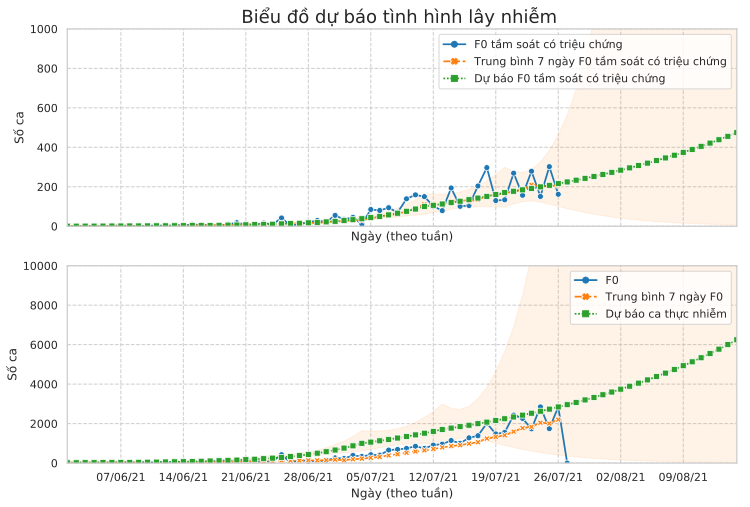

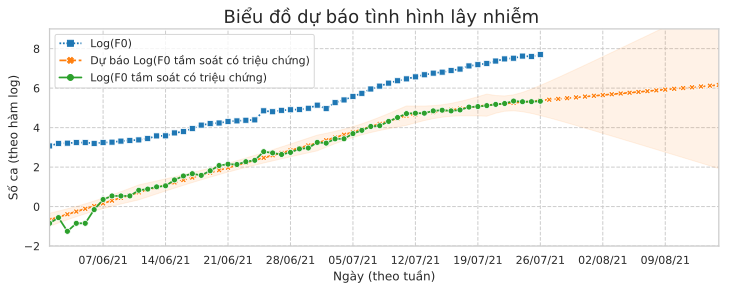

In [342]:
plotCases(f0_ve)
plotCasesLog(log_f0_ve)

### Kịch bản cao

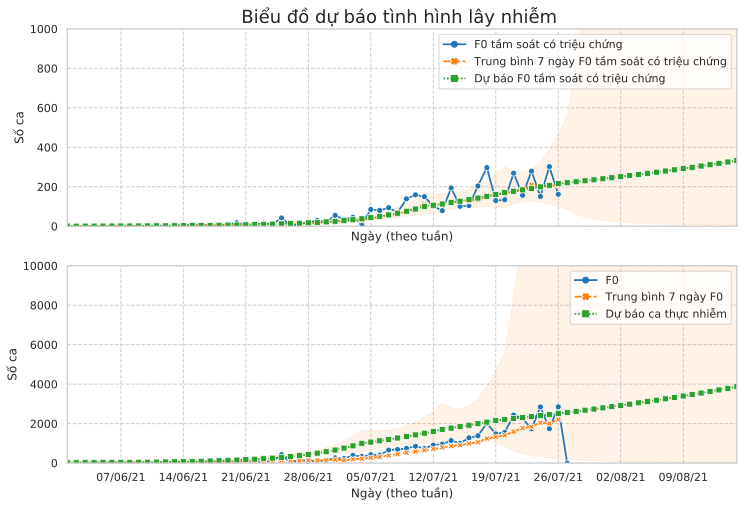

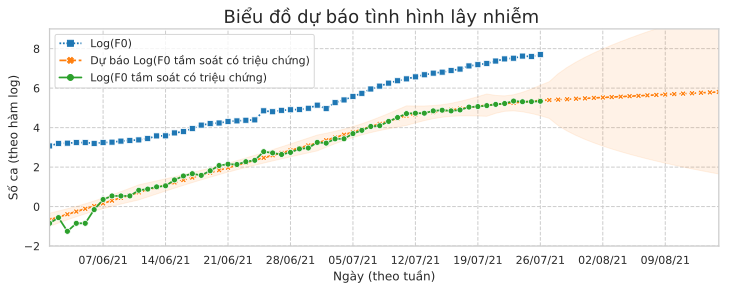

In [343]:
plotCases(f0_ve_kbc)
plotCasesLog(log_f0_ve_kbc)

### Kịch bản thấp

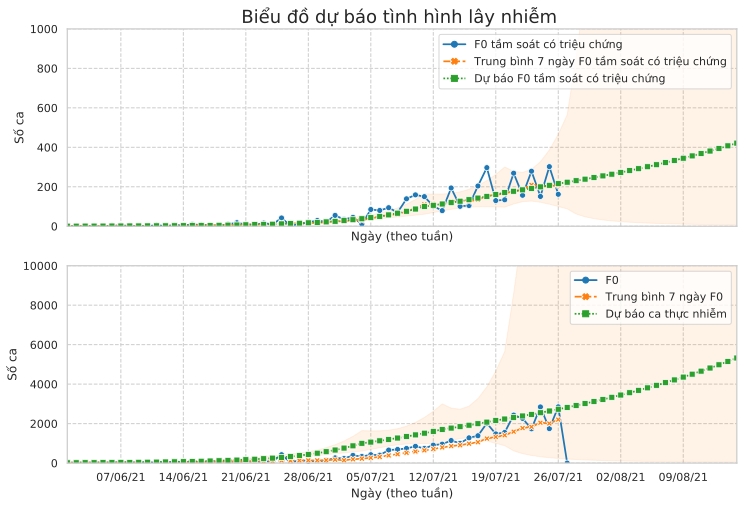

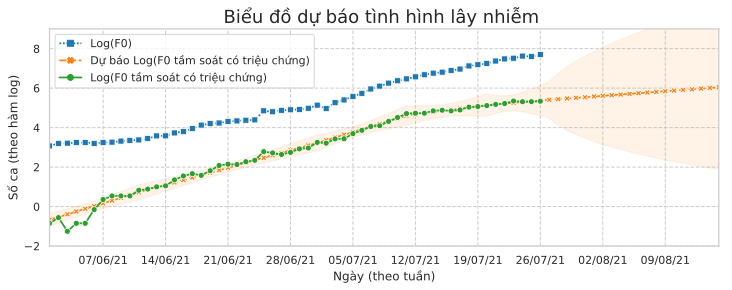

In [344]:
plotCases(f0_ve_kbt)
plotCasesLog(log_f0_ve_kbt)

# Quận/Huyện nguy cơ cao 

In [345]:
quan_huyen[quan_huyen != 'KHÔNG RÕ']
def plotQuanHuyenLog(quan_huyen, nrows=6, ncols=4):
    fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(12, 8), sharex=True, sharey=True, constrained_layout=True)
    sns.set_style("whitegrid", {'grid.linestyle': '--', 'grid.linewidth': 0.5})
    sns.set_context("notebook", rc={"lines.linewidth": 1.75})
    palette = sns.color_palette("tab10", n_colors=2)
    style_order = ['Log(F0 tầm soát có triệu chứng)', 'Dự báo Log(F0 tầm soát có triệu chứng)']
    z_order = ['Dự báo Log(F0 tầm soát có triệu chứng)', 'Log(F0 tầm soát có triệu chứng)']
    ax_no = 0
    for district in quan_huyen:
        ax = axes[ax_no//ncols, ax_no%ncols]
        log_f0_ve_qh, f0_ve_qh, cumulative_f0_ve_qh, beta_qh = get_metrics_VN(district=district, 
                                                                              policy_change_dates = policy_change_dates)#, last_data_date=pd.to_datetime('2021-06-25'), back_test=True)
        R0_after_qh = np.exp(sum(beta_qh[1:]))
        #plotCasesLog(log_f0_ve_qh, place="Quận/Huyện {}, R0 hiện tại {:.4f}".format(district, R0_after_qh))
        sns.lineplot(data=log_f0_ve_qh[z_order], style_order=style_order,
                    palette=palette, dashes=True, markers=True, ax=ax, legend=False)
        ax.fill_between(x=log_f0_ve_qh.index, 
                         y1=log_f0_ve_qh['Cận dưới Log(F0 tầm soát có triệu chứng)'], 
                         y2=log_f0_ve_qh['Cận trên Log(F0 tầm soát có triệu chứng)'],
                         alpha=0.1, color=palette[0], edgecolor='face')
        ax.set_xlim(xmin=datetime.date(2021, 6, 1), xmax=datetime.date(2021, 8, 15))
        ax.set_ylim(ymin=-2, ymax=8)
        #ax.set_xlabel('Ngày (theo tuần)')
        #ax.set_ylabel('Số ca (theo hàm log)')
        ax.set_title("{}, R0 {:.3f}".format(district, R0_after_qh)) 
                     #fontsize=18)
        ax.xaxis.set_major_locator(mdates.WeekdayLocator(byweekday=0, interval=1))
        ax.xaxis.set_major_formatter(mdates.DateFormatter('%d/%m'))
        leg = ax.get_legend()
        ax_no = ax_no + 1
    ax = axes[ax_no//ncols, ax_no%ncols]
    #ax.legend(leg)
    fig.autofmt_xdate()
    fig.suptitle('Dự báo tình hình dịch theo số ca tầm soát có triệu chứng')
    fig.text(0.5, 0.04, 'Ngày (theo tuần)', ha='center')
    fig.text(0.04, 0.5, 'Số ca tầm soát có triệu chứng (theo hàm log)', va='center', rotation='vertical')
    return fig

Hệ số lây nhiễm sau khi chỉ thị có hiệu lực, R0 cuối: 1.0283745096071655
Hệ số lây nhiễm sau khi chỉ thị có hiệu lực, R0 cuối: 0.9874578859510093
Hệ số lây nhiễm sau khi chỉ thị có hiệu lực, R0 cuối: 1.088206084038462
Hệ số lây nhiễm sau khi chỉ thị có hiệu lực, R0 cuối: 1.1143980679420245
Hệ số lây nhiễm sau khi chỉ thị có hiệu lực, R0 cuối: 1.113379031623255
Hệ số lây nhiễm sau khi chỉ thị có hiệu lực, R0 cuối: 1.134682603725805
Hệ số lây nhiễm sau khi chỉ thị có hiệu lực, R0 cuối: 1.027742369419164
Hệ số lây nhiễm sau khi chỉ thị có hiệu lực, R0 cuối: 1.1039160631725315
Hệ số lây nhiễm sau khi chỉ thị có hiệu lực, R0 cuối: 0.9186534261916818
Hệ số lây nhiễm sau khi chỉ thị có hiệu lực, R0 cuối: 1.035736679698192
Hệ số lây nhiễm sau khi chỉ thị có hiệu lực, R0 cuối: 1.0053275421782142
Hệ số lây nhiễm sau khi chỉ thị có hiệu lực, R0 cuối: 0.9437269226611568
Hệ số lây nhiễm sau khi chỉ thị có hiệu lực, R0 cuối: 1.1229393184871723
Hệ số lây nhiễm sau khi chỉ thị có hiệu lực, R0 cuối: 1.

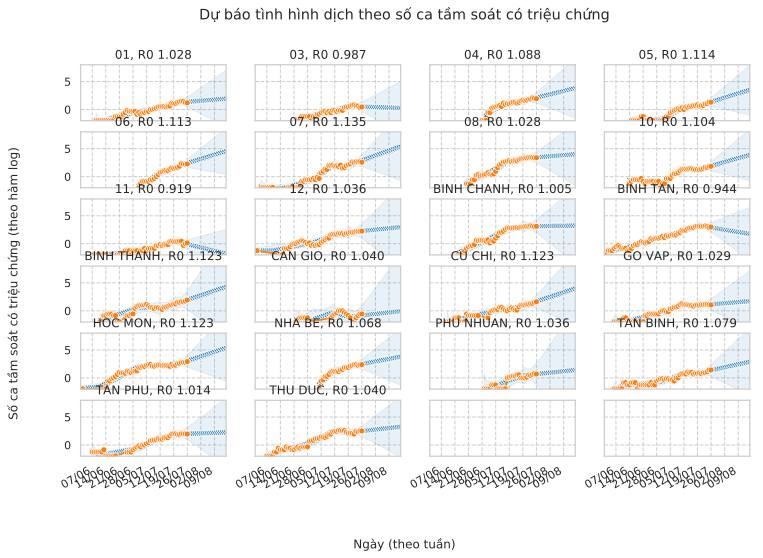

In [346]:
fig = plotQuanHuyenLog(quan_huyen[quan_huyen != 'KHÔNG RÕ'])

In [347]:
fig.savefig('Quan_Huyen.png')

Hệ số lây nhiễm sau khi chỉ thị có hiệu lực, R0 cuối: 1.0283745096071655
Hệ số lây nhiễm sau khi chỉ thị có hiệu lực, R0 cuối: 0.9874578859510093
Hệ số lây nhiễm sau khi chỉ thị có hiệu lực, R0 cuối: 1.088206084038462
Hệ số lây nhiễm sau khi chỉ thị có hiệu lực, R0 cuối: 1.1143980679420245
Hệ số lây nhiễm sau khi chỉ thị có hiệu lực, R0 cuối: 1.113379031623255
Hệ số lây nhiễm sau khi chỉ thị có hiệu lực, R0 cuối: 1.134682603725805
Hệ số lây nhiễm sau khi chỉ thị có hiệu lực, R0 cuối: 1.027742369419164
Hệ số lây nhiễm sau khi chỉ thị có hiệu lực, R0 cuối: 1.1039160631725315
Hệ số lây nhiễm sau khi chỉ thị có hiệu lực, R0 cuối: 0.9186534261916818
Hệ số lây nhiễm sau khi chỉ thị có hiệu lực, R0 cuối: 1.035736679698192
Hệ số lây nhiễm sau khi chỉ thị có hiệu lực, R0 cuối: 1.0053275421782142
Hệ số lây nhiễm sau khi chỉ thị có hiệu lực, R0 cuối: 0.9437269226611568
Hệ số lây nhiễm sau khi chỉ thị có hiệu lực, R0 cuối: 1.1229393184871723
Hệ số lây nhiễm sau khi chỉ thị có hiệu lực, R0 cuối: 1.

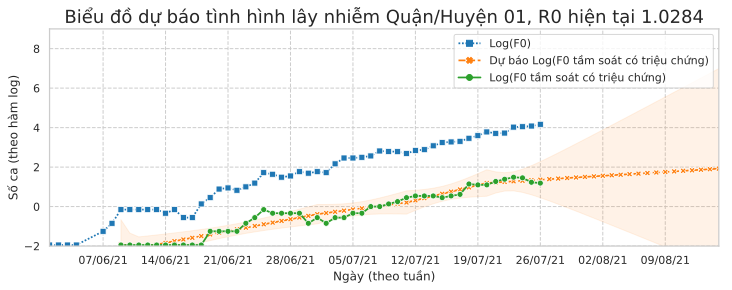

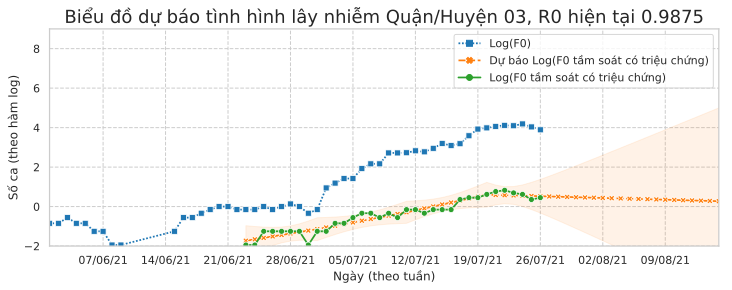

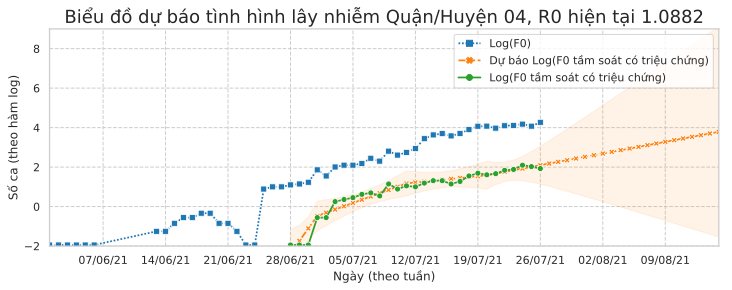

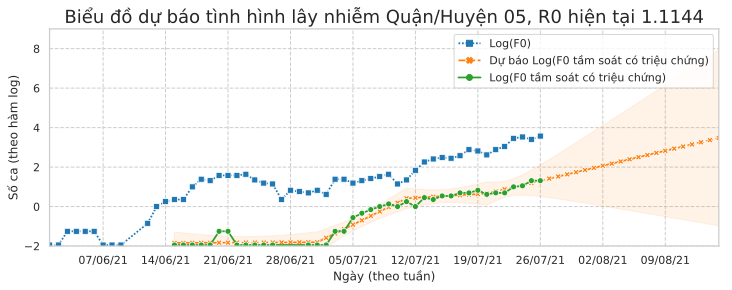

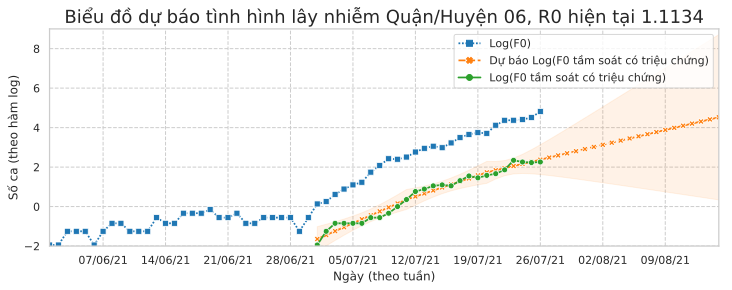

...

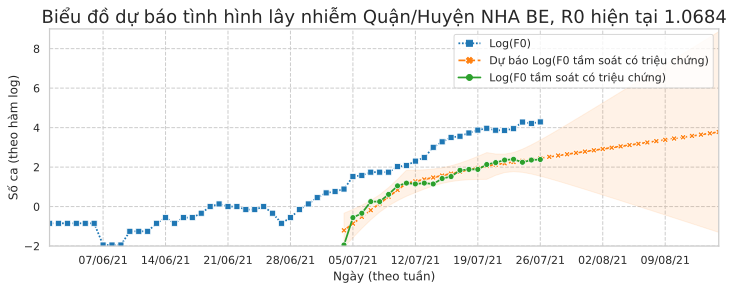

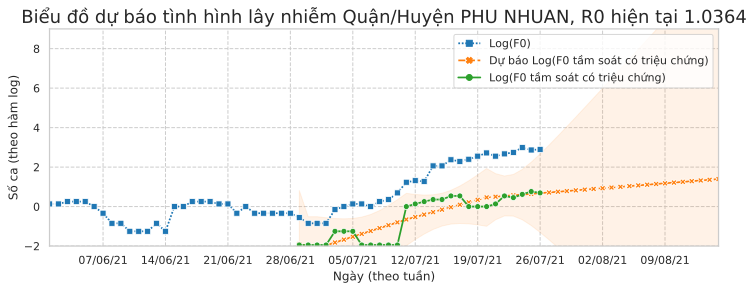

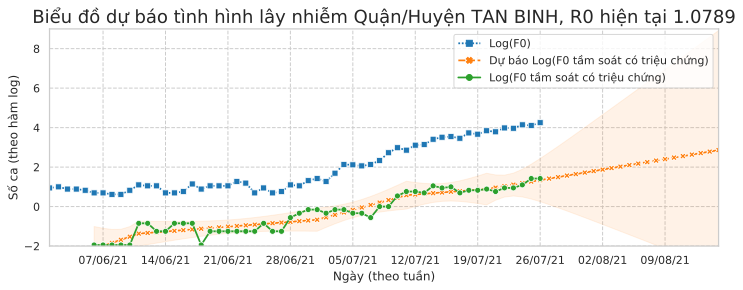

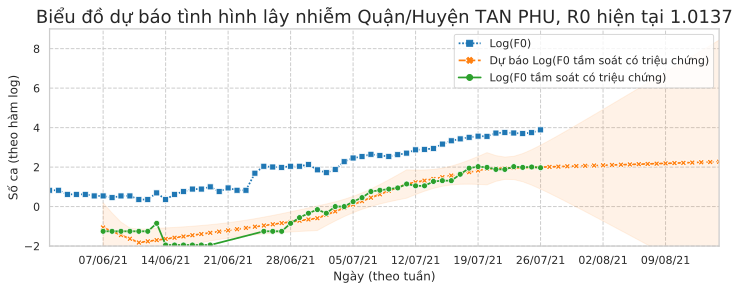

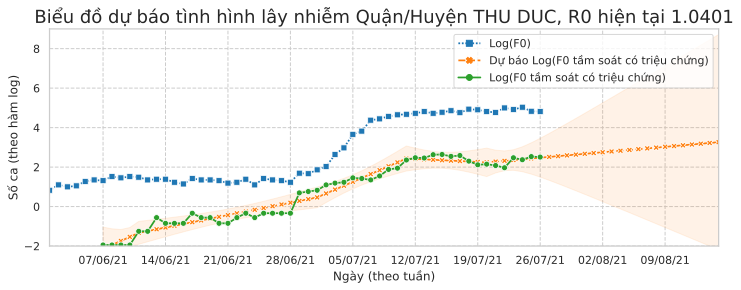

In [348]:
for district in quan_huyen[quan_huyen != 'KHÔNG RÕ']:
  log_f0_ve_qh, f0_ve_qh, cumulative_f0_ve_qh, beta_qh = get_metrics_VN(district=district, policy_change_dates = policy_change_dates)#, last_data_date=pd.to_datetime('2021-06-25'), back_test=True)
  R0_after_qh = np.exp(sum(beta_qh[1:]))
  R0_before_qh = np.exp(beta_qh[1])
  plotCasesLog(log_f0_ve_qh, place="Quận/Huyện {}, R0 hiện tại {:.4f}".format(district, R0_after_qh))